In [34]:
from pyhdf.SD import SD, SDC
import pyreadr
import numpy as np
import os
import matplotlib.pyplot as plt 
import pprint
import seaborn as sns; sns.set_theme()
import datetime
from pyproj import Proj
import numpy as np
import math
import collections
import Functions
import pandas as pd
from VPRM_offline.src.get_modis_point import get_modis_point

%run Functions.py

In [35]:
cwd = '/data/co2flux/common/mdomhoef/Oslo/Oslo_analysis/'

In [6]:
file_name = 'MOD13A1.A2017353.h18v02.006.2018004224839.hdf'
file_path = cwd + 'data/MODIS/2018_h18_v02/' + file_name

# file_path = cwd +'/data/MODIS/2018_h18_v02/MOD13A1.A2017353.h18v02.006.2018004224839.hdf'
print(file_path)
file = SD(file_path, SDC.READ)
print(file.info())

/data/co2flux/common/mdomhoef/Oslo/Oslo_analysis/data/MODIS/2018_h18_v02/MOD13A1.A2017353.h18v02.006.2018004224839.hdf
(12, 6)


In [7]:
# ? str.split
date = str.split(file_name, sep = ".")[1]
date[3:]
d = datetime.datetime.strptime(date[3:], '%y%j').date()
str(d)


'2017-12-19'

MOD09A1.A2006001.h08v05.005.2006012234657.hdf indicates:

MOD09A1 - Product Short Name <br>
.A2006001 - Julian Date of Acquisition (A-YYYYDDD) <br>
.h08v05 - Tile Identifier (horizontalXXverticalYY) <br>
.005 - Collection Version <br>
.2006012234567 - Julian Date of Production (YYYYDDDHHMMSS) <br>
.hdf - Data Format (HDF-EOS) <br>

In [8]:
datasets_dic = file.datasets()

for idx,sds in enumerate(datasets_dic.keys()):
    print(idx,sds)

0 500m 16 days NDVI
1 500m 16 days EVI
2 500m 16 days VI Quality
3 500m 16 days red reflectance
4 500m 16 days NIR reflectance
5 500m 16 days blue reflectance
6 500m 16 days MIR reflectance
7 500m 16 days view zenith angle
8 500m 16 days sun zenith angle
9 500m 16 days relative azimuth angle
10 500m 16 days composite day of the year
11 500m 16 days pixel reliability


In [9]:
sds_obj = file.select('500m 16 days EVI') # select sds

data = sds_obj.get() # get sds data
print(data.shape)

(2400, 2400)


In [10]:
# sds_obj = file.select('500m 16 days composite day of the year') # select sds

# data = sds_obj.get() # get sds data
# data[1][2000]

In [11]:
pprint.pprint( sds_obj.attributes() )

{'_FillValue': -3000,
 'add_offset': 0.0,
 'add_offset_err': 0.0,
 'calibrated_nt': 5,
 'long_name': '500m 16 days EVI',
 'scale_factor': 10000.0,
 'scale_factor_err': 0.0,
 'units': 'EVI',
 'valid_range': [-2000, 10000]}


In [12]:
pprint.pprint( sds_obj.attributes()['scale_factor'] )

10000.0


In [13]:
MODISpath = cwd + 'data/MODIS_OSLO/'


(array([5.081118e+06, 2.000000e+00, 1.307700e+04, 9.818000e+04,
        1.796430e+05, 1.269420e+05, 1.090900e+05, 7.555300e+04,
        3.961100e+04, 2.145600e+04, 9.624000e+03, 3.482000e+03,
        1.305000e+03, 5.040000e+02, 2.200000e+02, 1.140000e+02,
        3.300000e+01, 3.000000e+01, 1.300000e+01, 3.000000e+00]),
 array([-3000. , -2468.7, -1937.4, -1406.1,  -874.8,  -343.5,   187.8,
          719.1,  1250.4,  1781.7,  2313. ,  2844.3,  3375.6,  3906.9,
         4438.2,  4969.5,  5500.8,  6032.1,  6563.4,  7094.7,  7626. ]),
 <BarContainer object of 20 artists>)

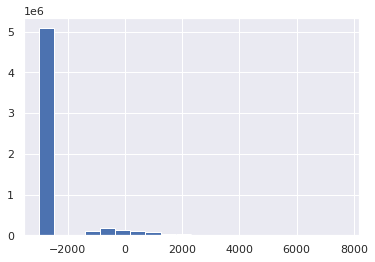

In [14]:
plt.hist(data.flatten(), bins = 20)

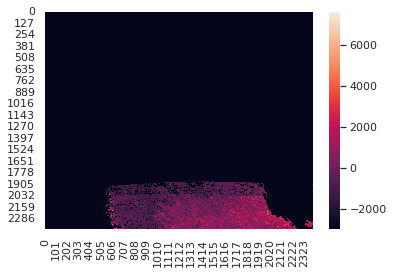

In [15]:
# uniform_data = np.random.rand(10, 12)
ax = sns.heatmap(data)

In [16]:
for key, value in sds_obj.attributes().items():
    print(key, value)
    if key == 'add_offset':
        add_offset = value  
    if key == 'scale_factor':
        scale_factor = value

long_name 500m 16 days EVI
units EVI
valid_range [-2000, 10000]
_FillValue -3000
scale_factor 10000.0
scale_factor_err 0.0
add_offset 0.0
add_offset_err 0.0
calibrated_nt 5


In [17]:
# data = (data - add_offset) / scale_factor
# print(data)

In [36]:
modis_dir = file_path = cwd + 'data/MODIS/2018_h18_v02/'

dirListing = os.listdir(modis_dir)
# for i in dirListing: 
#     date = str.split(i, sep = ".")[1]
#     title = datetime.datetime.strptime(date[3:], '%y%j').date()
#     print(str(title))

In [37]:
dirListing.sort()
dirListing
# dirListing = dirListing[0:3]

['MOD13A1.A2017353.h18v02.006.2018004224839.hdf',
 'MOD13A1.A2018001.h18v02.006.2018017225225.hdf',
 'MOD13A1.A2018017.h18v02.006.2018033224153.hdf',
 'MOD13A1.A2018033.h18v02.006.2018049223744.hdf',
 'MOD13A1.A2018049.h18v02.006.2018066170845.hdf',
 'MOD13A1.A2018065.h18v02.006.2018082153900.hdf',
 'MOD13A1.A2018081.h18v02.006.2018097235318.hdf',
 'MOD13A1.A2018097.h18v02.006.2018114000853.hdf',
 'MOD13A1.A2018113.h18v02.006.2018130002513.hdf',
 'MOD13A1.A2018129.h18v02.006.2018151111948.hdf',
 'MOD13A1.A2018145.h18v02.006.2018162010911.hdf',
 'MOD13A1.A2018161.h18v02.006.2018178001731.hdf',
 'MOD13A1.A2018177.h18v02.006.2018197104232.hdf',
 'MOD13A1.A2018193.h18v02.006.2018210004109.hdf',
 'MOD13A1.A2018209.h18v02.006.2018227130748.hdf',
 'MOD13A1.A2018225.h18v02.006.2018242001617.hdf',
 'MOD13A1.A2018241.h18v02.006.2018258000813.hdf',
 'MOD13A1.A2018257.h18v02.006.2018282131436.hdf',
 'MOD13A1.A2018273.h18v02.006.2018295112602.hdf',
 'MOD13A1.A2018289.h18v02.006.2018313115925.hdf',


Text(0.5, 0.98, '500m 16 days EVI')

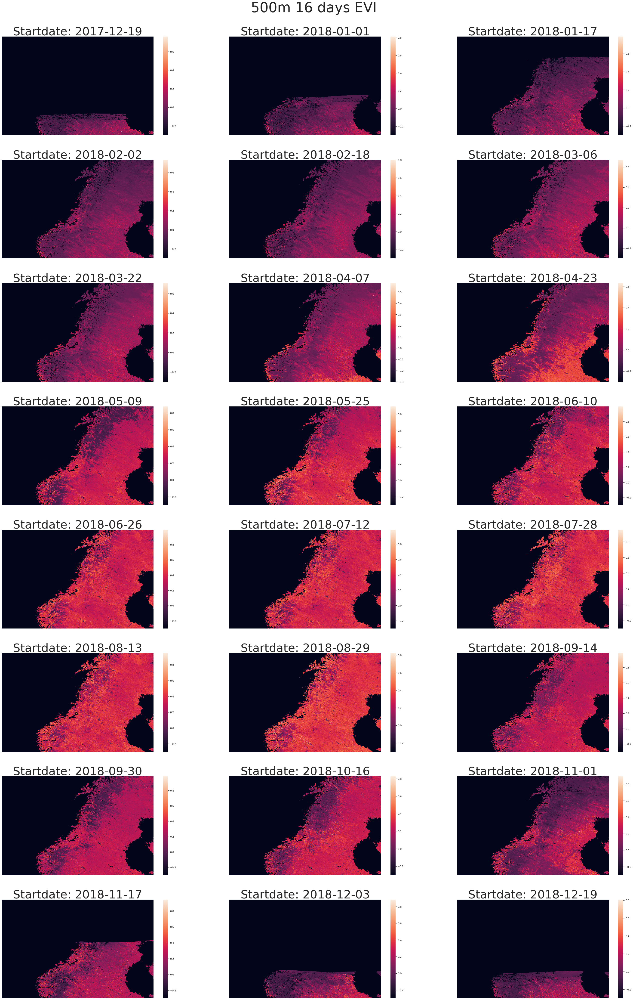

In [33]:
# fig, axs = plt.subplots(2, figsize = (20,30))
fig, axs = plt.subplots(nrows = int(len(dirListing)/3), ncols = 3, figsize = (50,70))
for i, ax in enumerate(axs.flat):
    date = str.split(dirListing[i], sep = ".")[1]
    title = datetime.datetime.strptime(date[3:], '%y%j').date()
    file_path = cwd + 'data/MODIS/2018_h18_v02/' + dirListing[i]
    file = SD(file_path, SDC.READ)
    sds_obj = file.select('500m 16 days EVI')
    data = sds_obj.get() # get sds data
    sns.heatmap(ax = ax, data = data/scale_factor).set_title('Startdate: '+ str(title), fontsize=50)
    ax.set(xticklabels=[]) 
    ax.set(yticklabels=[]) 
fig.subplots_adjust(top=0.95, hspace=0.25)
fig.suptitle("500m 16 days EVI", fontsize=60)
    # print(file)

In [ ]:
# As the satellite takes 16 days to make one round around the earth, Startdate indicates the time where the 16 days start again. The images displayed were not taken on this exact day but in the 16 day period afterwards. 

In [39]:
# #Forward Mapping 
# R = 6371007.181#m, the radius of the idealized sphere representing the Earth;
# T = 1111950 #m, the height and width of each MODIS tile in the projection plane;
# xmin = -20015109 #m, the western limit of the projection plane;
# ymax = 10007555 #m, the northern limit of the projection plane;
# size = data.shape[0]
# w = T /size # = 463.31271653 #m, the actual size of a “500-m” MODIS sinusoidal grid cell.


In [14]:
# FI-Hyy(61.84741, 24.29477)1956 350 19 2

# FI-Let(60.64183, 23.95952) 2245 418 19 2

# FI-Jok(60.8986, 23.51345) 2183 344 19 2

# FI-Qvd(60.295242, 22.391607)2328 262 19 2


lat, long = deg_to_rad(60.295242, 22.391607) 


i,j,h,v = forward_mapping(lat, long, R = 6371007.181, xmin = -20015109, ymax = 10007555 , T = 1111950 , size = 2400)

print(i,j,h,v)



2328 262 19 2


In [45]:
df_s, l_s = get_stations_tile_year(2018, 19,2)    
# ml = [deg_to_rad(*item) for item in df_s[['Latitude', 'Longitude']].values.tolist()]
index = [forward_mapping(*coords) for coords in [deg_to_rad(*item) for item in df_s[['Latitude', 'Longitude']].values.tolist()]]


In [46]:
df_s[['Station', 'Latitude', 'Longitude']].values.tolist()

[['FI-Hyy', 61.84741, 24.29477], ['FI-Let', 60.64183, 23.95952]]

In [ ]:
iv  ih    lon_min    lon_max   lat_min   lat_max
2  18     0.0000    29.2624   60.0000   70.0000
2  19    20.0000    58.5005   60.0000   70.0000
3  18     0.0000    20.0167   50.0000   60.0000



In [79]:
# print(dirListing)
evi_dict = {}
for file in dirListing: 
    date = str.split(file, sep = ".")[1]
    title = datetime.datetime.strptime(date[3:], '%y%j').date()    
    file_path = cwd + 'data/MODIS/2018_h18v02/'
    data = get_modis_layer(file, file_path) 
    # evi = data[(1956, 350)]#/scale_factor
    evi = [data[x] for x in index]
    evi_dict[str(title)] = evi
    

In [80]:
od = collections.OrderedDict(sorted(evi_dict.items()))

In [81]:
pd.DataFrame.from_dict(od, orient='index', columns = l_s)

,FI-Hyy,FI-Let,SE-Ros,SE-Svb,SE-Deg,SE-Nor
2017-12-19,NaN,NaN,NaN,NaN,NaN,0.2709
2018-01-01,NaN,NaN,NaN,NaN,NaN,0.3083
2018-01-17,NaN,NaN,0.0296,0.1480,0.0568,0.3084
2018-02-02,NaN,NaN,0.0595,0.0586,-0.0214,0.1578
2018-02-18,NaN,NaN,0.1770,0.1031,0.0031,0.1524
2018-03-06,NaN,NaN,0.1708,0.2103,0.0492,0.1766
2018-03-22,NaN,NaN,0.1315,0.1824,0.0343,0.2076
2018-04-07,NaN,NaN,0.1086,0.1790,-0.0049,0.2553
2018-04-23,NaN,NaN,0.2658,0.2072,0.0793,0.2626
2018-05-09,NaN,NaN,0.2154,0.2752,0.2731,0.3050


In [82]:
df_s, l_s = get_stations_tile_year(2018, 18,3)    
l_s

array(['SE-Lnn', 'SE-Htm'], dtype=object)

In [83]:
index = [forward_mapping(*coords) for coords in [deg_to_rad(*item) for item in df_s[['Latitude', 'Longitude']].values.tolist()]]
index

[(397, 1649), (936, 1795)]

In [85]:
modis_dir = file_path = cwd + 'data/MODIS/2018_h18_v03/'

dirListing = os.listdir(modis_dir)
evi_dict = {}
for file in dirListing: 
    date = str.split(file, sep = ".")[1]
    title = datetime.datetime.strptime(date[3:], '%y%j').date()    
    file_path = cwd + 'data/MODIS/2018_h18_v03/'
    data = get_modis_layer(file, file_path) 
    # evi = data[(1956, 350)]#/scale_factor
    evi = [data[x] for x in index]
    evi_dict[str(title)] = evi

In [86]:
od = collections.OrderedDict(sorted(evi_dict.items()))
od

OrderedDict([('2017-12-19', [0.1427, 0.2143]),
             ('2018-01-01', [0.1427, 0.3143]),
             ('2018-01-17', [0.1751, 0.2778]),
             ('2018-02-02', [0.0171, 0.3427]),
             ('2018-02-18', [-0.0092, 0.2596]),
             ('2018-03-06', [0.116, 0.3597]),
             ('2018-03-22', [0.1185, 0.2738]),
             ('2018-04-07', [0.2186, 0.2732]),
             ('2018-04-23', [0.2355, 0.3473]),
             ('2018-05-09', [0.4143, 0.3849]),
             ('2018-05-25', [0.3509, 0.4438]),
             ('2018-06-10', [0.5892, 0.4845]),
             ('2018-06-26', [0.39, 0.4923]),
             ('2018-07-12', [0.2673, 0.4017]),
             ('2018-07-28', [0.2456, 0.4149]),
             ('2018-08-13', [0.2602, 0.419]),
             ('2018-08-29', [0.2341, 0.4288]),
             ('2018-09-14', [0.3892, 0.4031]),
             ('2018-09-30', [0.4286, 0.3636]),
             ('2018-10-16', [0.5682, 0.3454]),
             ('2018-11-01', [0.2571, 0.4313]),
             ('2

In [100]:
df = pd.DataFrame.from_dict(od, orient='index', columns = l_s)
# df = df.iloc[1: , :]
df

,SE-Lnn,SE-Htm
2018-01-01,0.1427,0.3143
2018-01-17,0.1751,0.2778
2018-02-02,0.0171,0.3427
2018-02-18,-0.0092,0.2596
2018-03-06,0.1160,0.3597
2018-03-22,0.1185,0.2738
2018-04-07,0.2186,0.2732
2018-04-23,0.2355,0.3473
2018-05-09,0.4143,0.3849
2018-05-25,0.3509,0.4438


In [90]:
path = cwd + 'Station_evi_lswi_temp_rad_2018.csv'
evi_stations = pd.read_csv(path)
evi_stations.head()

,Times,FI-Hyy_EVI,FI-Hyy_LSWI,FI-Hyy_TEMP_ERA5,FI-Hyy_RAD_ERA5,FI-Hyy_TEMP_Station,FI-Hyy_RAD_Station,FI-Let_EVI,FI-Let_LSWI,FI-Let_TEMP_ERA5,...,SE-Htm_TEMP_ERA5,SE-Htm_RAD_ERA5,SE-Htm_TEMP_Station,SE-Htm_RAD_Station,SE-Nor_EVI,SE-Nor_LSWI,SE-Nor_TEMP_ERA5,SE-Nor_RAD_ERA5,SE-Nor_TEMP_Station,SE-Nor_RAD_Station
0,2018-01-01 00:00:00,NaN,NaN,-1.870661,0.0,-1.925,2.170,NaN,NaN,-1.114754,...,5.705864,0.0,6.204,0.0,0.363961,0.395785,0.744421,0.0,0.332,0.0
1,2018-01-01 00:30:00,NaN,NaN,-1.874050,0.0,-1.796,2.313,NaN,NaN,-1.092246,...,5.706626,0.0,6.227,0.0,0.363825,0.395984,0.754609,0.0,0.225,0.0
2,2018-01-01 01:00:00,NaN,NaN,-1.877440,0.0,-1.778,2.621,NaN,NaN,-1.069738,...,5.707389,0.0,6.275,0.0,0.363690,0.396184,0.764797,0.0,0.213,0.0
3,2018-01-01 01:30:00,NaN,NaN,-1.902402,0.0,-1.807,3.060,NaN,NaN,-1.123915,...,5.578838,0.0,6.311,0.0,0.363555,0.396383,0.754831,0.0,0.226,0.0
4,2018-01-01 02:00:00,NaN,NaN,-1.927365,0.0,-1.765,2.259,NaN,NaN,-1.178091,...,5.450288,0.0,6.306,0.0,0.363420,0.396583,0.744865,0.0,0.257,0.0


In [91]:
# cols = [col for col in evi_stations.columns if 'SE-Lnn' in col]
# cols = cols + [col for col in evi_stations.columns if 'SE-Htm' in col]
evi_st = evi_stations[['Times', 'SE-Lnn_EVI', 'SE-Htm_EVI']]
evi_st.head()

,Times,SE-Lnn_EVI,SE-Htm_EVI
0,2018-01-01 00:00:00,0.075908,0.231445
1,2018-01-01 00:30:00,0.075956,0.231286
2,2018-01-01 01:00:00,0.076004,0.231127
3,2018-01-01 01:30:00,0.076053,0.230968
4,2018-01-01 02:00:00,0.076101,0.230809


In [92]:
evi_st.shape

(17520, 3)

In [93]:
17520/48

365.0

In [94]:
48*16

768

In [95]:
17520/48

365.0

In [96]:
365/16

22.8125

In [97]:
ls = evi_st[['SE-Lnn_EVI', 'SE-Htm_EVI']].iloc[0:17519].mean(axis=0)
print(ls)

SE-Lnn_EVI    0.260741
SE-Htm_EVI    0.324987
dtype: float64


In [98]:
means = pd.DataFrame(columns = ['Time', 'SE-Lnn_EVI', 'SE-Htm_EVI'])
for i in range(0, 23):
    start = i*768
    end = (i+1) * 768 -1
    if(end > 17519): end = 17519
    ls = evi_st[['SE-Lnn_EVI', 'SE-Htm_EVI']].iloc[start:end].mean(axis=0)
    # print(evi_st['Times'].iloc[start], ls[0], ls[1])
    means.loc[i] = [evi_st['Times'].iloc[start], ls[0], ls[1]]
    # means.append(ls)

In [101]:
print(means.shape)
print(df.shape)


(23, 3)
(23, 2)


In [125]:
df.head()

,SE-Lnn,SE-Htm
2018-01-01,0.1427,0.3143
2018-01-17,0.1751,0.2778
2018-02-02,0.0171,0.3427
2018-02-18,-0.0092,0.2596
2018-03-06,0.1160,0.3597


In [126]:
new_df = pd.concat([means, df.reset_index(drop=False)], axis = 1)
new_df = new_df.drop('Time', axis = 1)
new_df_1 = new_df[['SE-Lnn_EVI', 'index', 'SE-Lnn']]
new_df_1 =new_df_1.rename(columns={'SE-Lnn_EVI':'ERA5_Mean', 'SE-Lnn':'MODIS_16d'})
new_df_2 = new_df[['SE-Htm_EVI', 'index', 'SE-Htm']]
new_df_2 = new_df_2.rename(columns={'SE-Htm_EVI':'Htm_ERA5_Mean', 'SE-Htm':'Htm_MODIS_16d'})


In [127]:
dfm_1 = new_df_1.melt('index', var_name='cols', value_name='vals')
dfm_2 = new_df_2.melt('index', var_name='cols', value_name='vals')


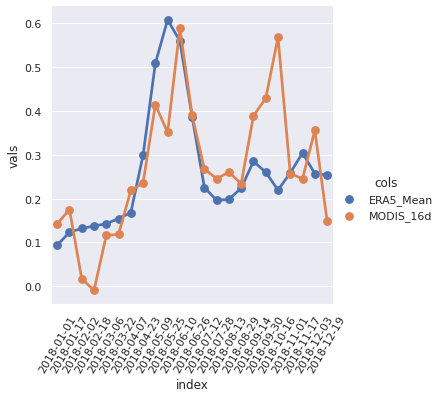

In [128]:
g = sns.catplot(x="index", y="vals", hue='cols', data=dfm_1, kind='point')#, facet_kws={'legend_out': True})
g.set_xticklabels(rotation=60)
# sns.pointplot(x="index", y="vals", hue='cols', data=dfm)
# title
# new_title = 'EVI 2018 Station Lnn'
# g.set_title(new_title)
# replace labels
# new_labels = ['era5 preprocessing mean', 'MODIS 16days']
# for t, l in zip(g._legend.texts, new_labels):
#     t.set_text(l)

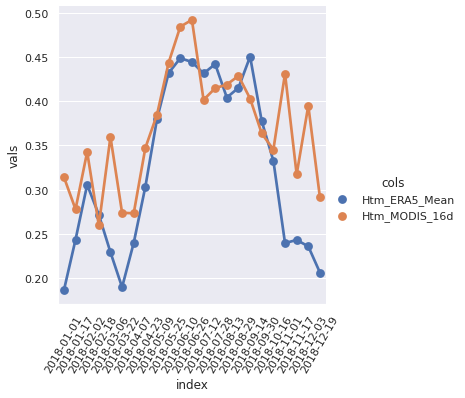

In [129]:
g = sns.catplot(x="index", y="vals", hue='cols', data=dfm_2, kind='point')
g.set_xticklabels(rotation=60)

In [25]:
# analyse years 
cwd = '/data/co2flux/common/mdomhoef/Oslo/Oslo_analysis/'
# StationDataPath = cwd + 'data/HH_Data_small/'

stations_file = cwd + 'Stations.csv'
years_file = cwd + 'Station_years.csv'

stations = pd.read_csv(stations_file, sep = ',')


for index, row in stations.iterrows():
    print(row['Station'])
    lat, long = deg_to_rad(row['Latitude'], row['Longitude']) 
    i,j,h,v = forward_mapping(lat, long, R = 6371007.181, xmin = -20015109, ymax = 10007555 , T = 1111950 , size = 2400)
    print(i,j,h,v)

DK-Fou
843 1270 18 3
DK-Eng
1033 1648 18 3
DK-Gds
941 1249 18 3
FI-Hyy
1956 350 19 2
FI-Let
2245 418 19 2
FI-Jok
2183 344 19 2
FI-Qvd
2328 262 19 2
SE-Lnn
397 1649 18 3
SE-Ros
1398 2063 18 2
SE-Svb
1378 2060 18 2
SE-Deg
1395 2043 18 2
SE-Htm
936 1795 18 3
SE-Nor
2378 2091 18 2


In [28]:

data = get_modis_point(year=year, lat = lat, lon = lon, tile = tile, MODISpath = MODISpath)


NameError: name 'year' is not defined